<font color="black"><font size="7"><br>
     Project 6 - Computer Vision
</font>

In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

from PIL import Image
from PIL import ImageOps, ImageFilter

import cv2 as cv

import os

from sklearn.cluster import KMeans
from sklearn.cluster import MiniBatchKMeans

from sklearn.manifold import TSNE

# Preprocessing

## Convert image to grey scale

In [8]:
img = Image.open('D:/Data OC/P6/photos/__9tqurgsEJaXfkj0vCzxA.jpg')

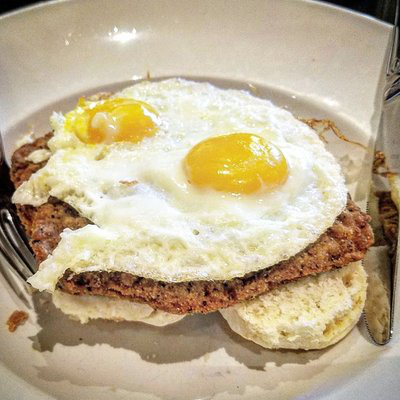

In [9]:
img

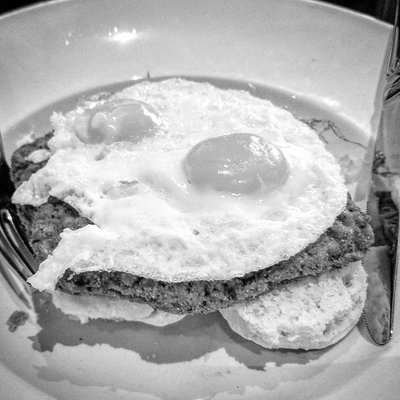

In [10]:
gray = img.convert('L')
gray

## Histogram

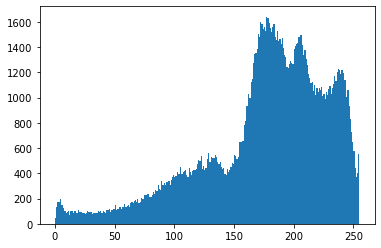

In [5]:
plt.hist(np.array(gray).flatten(),bins=range(256))
plt.show()

## Etirement de l'histogram - Autocontrast

In [6]:
gray_c = ImageOps.autocontrast(gray,cutoff=0.2)

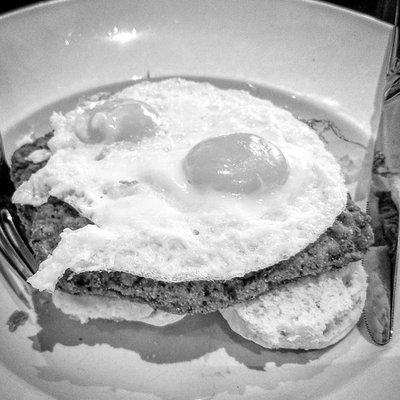

In [7]:
gray_c

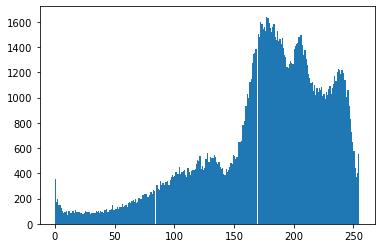

In [9]:
plt.hist(np.array(gray_c).flatten(),bins=range(256))
plt.show()

## Egalisation

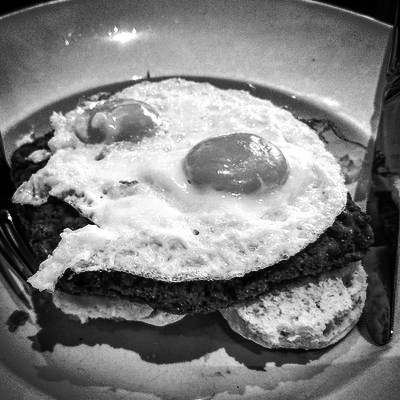

In [10]:
gray_e = ImageOps.equalize(gray_c)
gray_e

## Filtrage

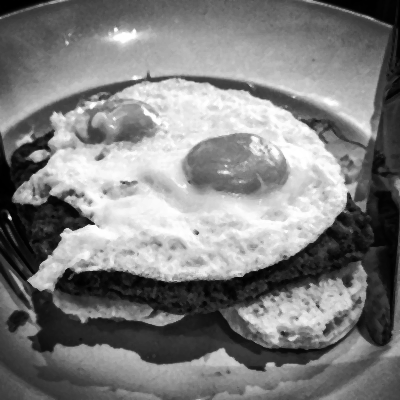

In [11]:
gray_f = gray_e.filter(ImageFilter.MedianFilter)
gray_f

In [12]:
gray_f.save(fp='data/photos_pre/2.jpg')

## Pipeline

In [4]:
def preprocess_picture(picture):
    return ImageOps.equalize(ImageOps.autocontrast(picture.convert('L'))).filter(ImageFilter.MedianFilter)

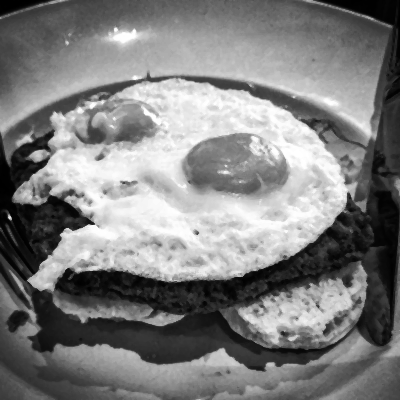

In [14]:
preprocess_picture(img)

# SIFT

In [13]:
img1 = cv.imread('data/Test_photos/coke_logo.png')
img2 = cv.imread('data/Test_photos/coke_rotated.png')

In [14]:
gray1 = cv.cvtColor(img1,cv.COLOR_BGR2GRAY)
gray2 = cv.cvtColor(img2,cv.COLOR_BGR2GRAY)

In [15]:
sift = cv.SIFT_create(30,sigma=4)

In [16]:
#compute keypoints and descriptors
kp1, des1 = sift.detectAndCompute(gray1,None)
kp2, des2 = sift.detectAndCompute(gray2,None)

In [17]:
np.shape(des1)

(30, 128)

In [18]:
#add keypoints and descriptors on images
img3=cv.drawKeypoints(gray1,kp1,img1,flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img4=cv.drawKeypoints(gray2,kp2,img2,flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

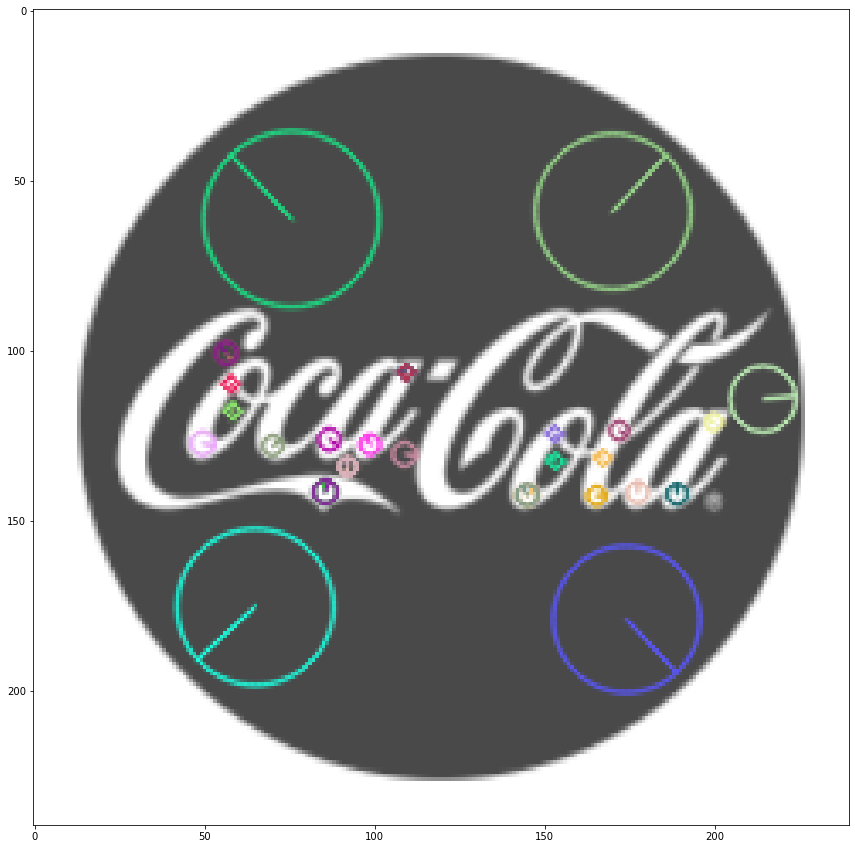

In [19]:
plt.figure(figsize=(15,15))
plt.imshow(img1)

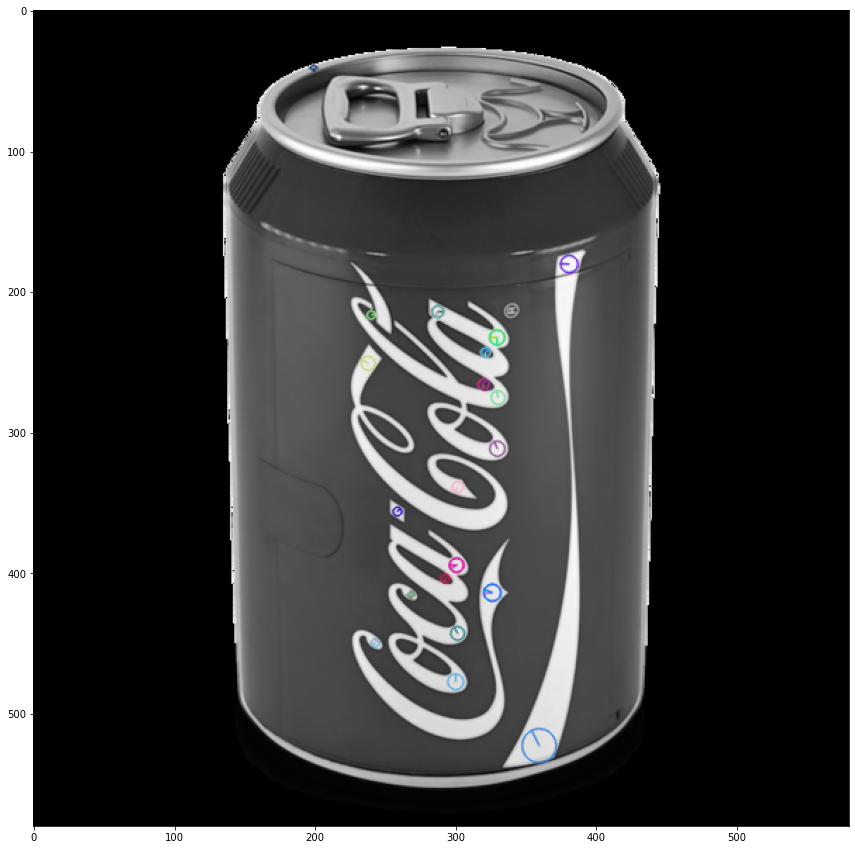

In [20]:
plt.figure(figsize=(15,15))
plt.imshow(img2)

# Feature matching

In [21]:
img1 = cv.imread('data/Test_photos/coke_logo.png')
img2 = cv.imread('data/Test_photos/coke_fridge.jpg')
gray1 = cv.cvtColor(img1,cv.COLOR_BGR2GRAY)
gray2 = cv.cvtColor(img2,cv.COLOR_BGR2GRAY)

In [27]:
sift = cv.SIFT_create(300,sigma=2)

In [28]:
kp1, des1 = sift.detectAndCompute(gray1,None)
kp2, des2 = sift.detectAndCompute(gray2,None)

In [22]:
#compute matching descriptors
bf = cv.BFMatcher()
matches = bf.knnMatch(des1,des2,k=2)

In [23]:
#filter the matching desriptors with a threshold
good = []
for m,n in matches:
    if m.distance < 0.85*n.distance:
        good.append([m])

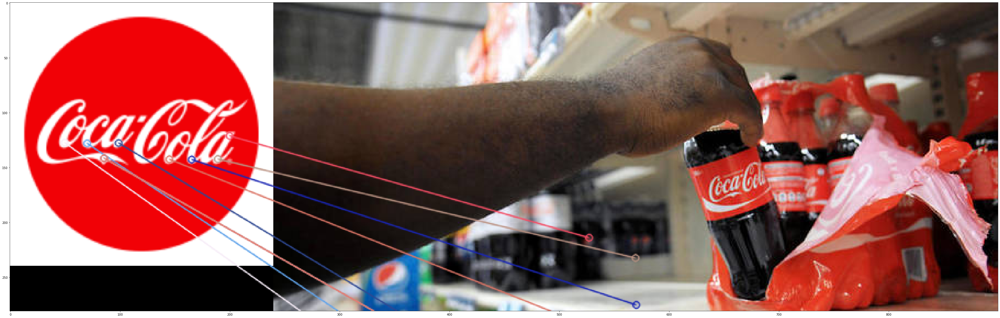

(<matplotlib.image.AxesImage at 0x1e9ccc20ca0>, None)

In [24]:
# cv.drawMatchesKnn expects list of lists as matches.
plt.figure(figsize=(60,60))
img3 = cv.drawMatchesKnn(img1,kp1,img2,kp2,good,None,flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(cv.cvtColor(img3,cv.COLOR_BGR2RGB)),plt.show()

# Test on our data

In [32]:
img1 = cv.imread('data/photos_pre/0FJ8dZnWCMRGNdsgPJTQgg.jpg')
img2 = cv.imread('data/photos_pre/0k2HgFR7FdOxgl0tBGHJng.jpg')
gray1 = cv.cvtColor(img1,cv.COLOR_BGR2GRAY)
gray2 = cv.cvtColor(img2,cv.COLOR_BGR2GRAY)

In [33]:
cv.imshow('image1',gray1)
cv.imshow('image2',gray2)
cv.waitKey(0)
cv.destroyAllWindows()

In [34]:
sift = cv.SIFT_create(300,sigma=2)

In [35]:
kp1, des1 = sift.detectAndCompute(gray1,None)
kp2, des2 = sift.detectAndCompute(gray2,None)

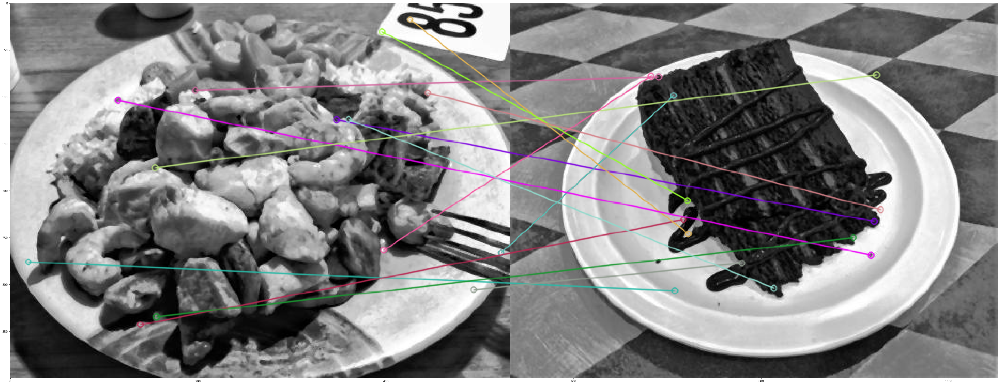

(<matplotlib.image.AxesImage at 0x191a74bae20>, None)

In [36]:
bf = cv.BFMatcher()
matches = bf.knnMatch(des1,des2,k=2)

good = []
for m,n in matches:
    if m.distance < 0.85*n.distance:
        good.append([m])
        
# cv.drawMatchesKnn expects list of lists as matches.
plt.figure(figsize=(60,60))
img3 = cv.drawMatchesKnn(img1,kp1,img2,kp2,good,None,flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(cv.cvtColor(img3,cv.COLOR_BGR2RGB)),plt.show()

# Preprocessing batch

In [ ]:
files = os.listdir('D:/Data OC/P6/photos/')

In [ ]:
files[0]

In [ ]:
for file in files[0:500]:
    pic =  Image.open('D:/Data OC/P6/photos/'+file)
    pre_pic = preprocess_picture(pic)
    pre_pic.save(fp='data/photos_pre/'+file)

 # BOVW based on SIFT descriptors

## Calculating descriptors and dictionnary

In [26]:
files = os.listdir('D:/Data OC/P6/photos/')

In [27]:
sift = cv.SIFT_create()

In [28]:
#dictionnary of descriptors
sift_d = {}
des_list=[]

for file in files[0:1000]:    
    pic =  Image.open('D:/Data OC/P6/photos/'+file)
    
    pre_pic = np.array(preprocess_picture(pic))
    kp, des = sift.detectAndCompute(image=pre_pic,mask=None)
    
    sift_d[file] = des
    for d in des:
        des_list.append(d)    

NameError: name 'preprocess_picture' is not defined

In [41]:
len(des_list)

1274150

## Clustering SIFT descriptors

In [42]:
k = 200

In [43]:
kmeans = MiniBatchKMeans(n_clusters = k, batch_size = 50000).fit(des_list)

## Calculating BOVW

In [44]:
files = os.listdir('D:/Data OC/P6/photos/')[0:1000]
bow = pd.DataFrame(index=files[0:1000],columns=np.arange(0,len(kmeans.cluster_centers_)))
bow = bow.fillna(0)

In [ ]:
i=0

for file in sift_d.keys():
       for d in sift_d[file]:
            idx = kmeans.predict([d])
            bow.loc[file,idx]+=1
            i+=1
    

## Pipeline - Preprocessing and BOW

In [2]:
def pipeline_img(directory,nb_pics=1000,nb_words=200,nb_features_sift=500):
    files = os.listdir(directory)
    sift = cv.SIFT_create(nb_features_sift)
    
    sift_d = {}
    des_list=[]
    
    print('computing descriptors')
    for file in files[0:nb_pics]:    
        pic =  Image.open(directory+file)    
        pre_pic = np.array(preprocess_picture(pic))
        kp, des = sift.detectAndCompute(image=pre_pic,mask=None)
    
        sift_d[file] = des
        for d in des:
            des_list.append(d)
    
    print('clustering descriptors')
    kmeans = MiniBatchKMeans(n_clusters = nb_words, batch_size = 50000).fit(des_list)
    
    
    bow = pd.DataFrame(index=files[0:nb_pics],columns=np.arange(0,len(kmeans.cluster_centers_)))
    bow = bow.fillna(0)
    
    print('computing Bovw')
    i=0
    for file in sift_d.keys():
        for d in sift_d[file]:
            idx = kmeans.predict([d])
            bow.loc[file,idx]+=1
            i+=1
    return bow

In [5]:
bow = pipeline_img(directory = 'D:/Data OC/P6/photos/', nb_pics=1000, nb_words=50,nb_features_sift=300)

computing descriptors
clustering descriptors
computing Bovw


In [6]:
bow.to_pickle('bow')

# Visualisation

## t-SNE

In [7]:
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

In [8]:
plt.rcParams["figure.figsize"]=40,40

In [9]:
tsne =TSNE(perplexity=200)
viz = tsne.fit_transform(bow)

<Figure size 18000x18000 with 0 Axes>

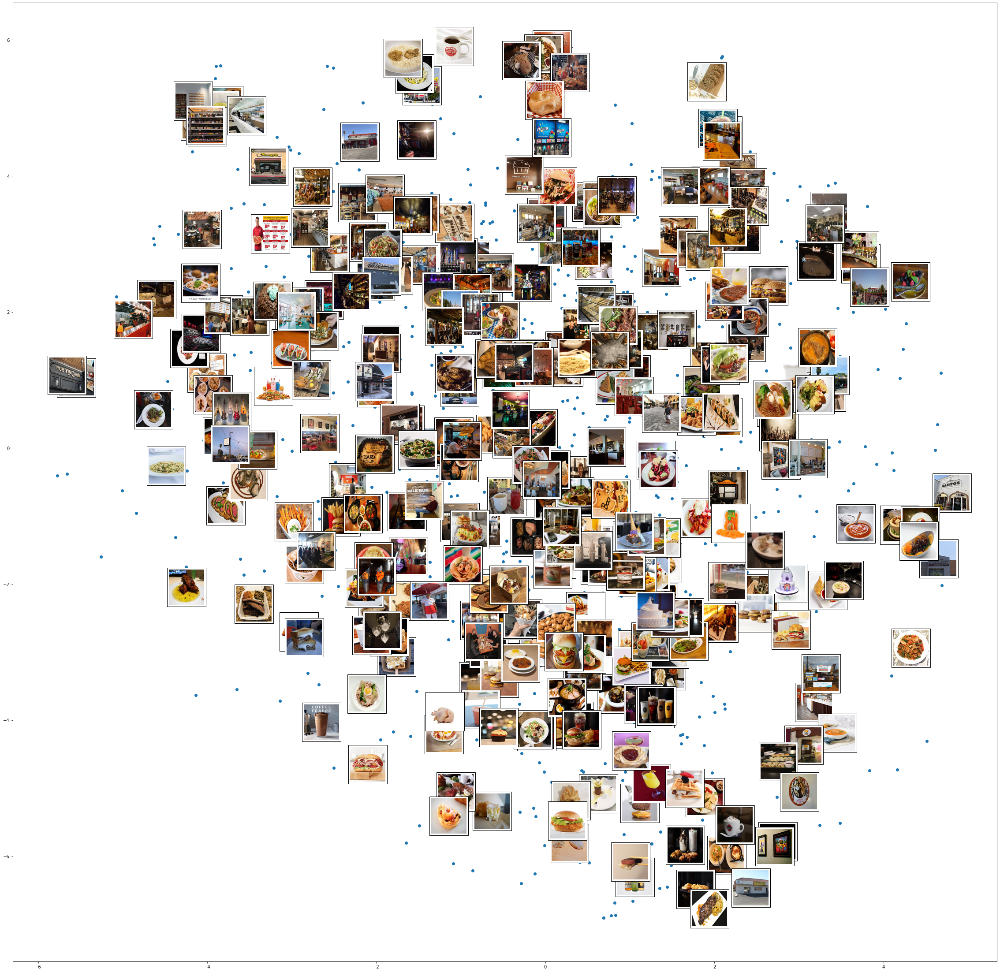

In [10]:
files = os.listdir('D:/Data OC/P6/photos/')[0:1000]
plt.figure(figsize=(250,250))
fig, ax = plt.subplots()
plt.scatter(x=viz[:,0],y=viz[:,1])

for i in range(viz.shape[0]//3): #we'll print 1 image over 3
    file = files[i*3]
    img=Image.open('D:/Data OC/P6/photos/'+file)
    img = img.resize((80,80))
    x=viz[i*3, 0]
    y=viz[i*3, 1]
    ab = AnnotationBbox(OffsetImage(img),(x,y))
    ax.add_artist(ab)
    
plt.savefig('r.png')

# Using transfert learning with CNN

## Getting labels

In [10]:
import json

In [11]:
#Create the columns for dataframe
with open("D:/Data OC/P6/photos.json",encoding="utf8") as f:
     for i, line in enumerate(f):
        first_line = json.loads(line)
        if i>=0:
            break
data = pd.DataFrame(columns=first_line.keys())


         

In [12]:
#parse data and load in dataframe
with open("D:/Data OC/P6/photos.json",encoding="utf8") as f:
     for i, line in enumerate(f):
            data.loc[i] = json.loads(line).values()
            if i>=1000:
                break

In [13]:
good_labels = ['inside','food','outside','drink']

In [14]:
data['label'] = [0 if not(lab in good_labels) else lab for lab in data['label']]

In [15]:
data = data[data['label']!=0]

In [16]:
data.drop(columns=['business_id','caption'],inplace=True)

In [17]:
data.shape

(997, 2)

## creating folder for Keras train and validation sets

### Buidling directories

In [47]:
os.mkdir("D:/Data OC/P6/photo_keras")

In [48]:
os.mkdir("D:/Data OC/P6/photo_keras/train")

In [49]:
os.mkdir("D:/Data OC/P6/photo_keras/validation")

In [24]:
train_dir="D:/Data OC/P6/photo_keras/train"
validation_dir="D:/Data OC/P6/photo_keras/validation"

In [51]:
os.mkdir(train_dir+'/inside')
os.mkdir(train_dir+'/food')
os.mkdir(train_dir+'/outside')
os.mkdir(train_dir+'/drink')

In [52]:
os.mkdir(validation_dir+'/inside')
os.mkdir(validation_dir+'/food')
os.mkdir(validation_dir+'/outside')
os.mkdir(validation_dir+'/drink')

In [53]:
from shutil import copyfile,move

### Copying picture in the right label directory

In [54]:
for label in good_labels:
    for pic_id in data[data['label']==label].photo_id:
        copyfile("D:/Data OC/P6/photos/"+pic_id+".jpg",
                 train_dir+'/'+label+'/'+pic_id+'.jpg')
        
    

### Separting train and validation 80/20

In [55]:
for label in good_labels:
    for pic_id in data[data['label']==label].photo_id.sample(int(data[data['label']==label].shape[0]*0.2)):
        move(train_dir+'/'+label+'/'+pic_id+'.jpg',validation_dir+'/'+label+'/'+pic_id+'.jpg')
        

## Prepare model

In [18]:
from keras.models import Model
from keras import Sequential
from keras.layers import Flatten, Dropout
from keras.applications.vgg16 import VGG16
from keras.layers import Dense

### Load pre-trained model

In [19]:
vgg_conv = VGG16(weights="imagenet",
                 include_top=False, 
                 input_shape=(224, 224, 3))

### Prepare pre-trained model for training

In [20]:
# Freeze all the layers
for layer in vgg_conv.layers[:]:
    layer.trainable = False

# Check the trainable status of the individual layers
for layer in vgg_conv.layers:
    print(layer, layer.trainable)


<tensorflow.python.keras.engine.input_layer.InputLayer object at 0x000001895A12A490> False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x000001895FEF6CA0> False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x000001895FF18070> False
<tensorflow.python.keras.layers.pooling.MaxPooling2D object at 0x000001895FF873D0> False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x000001895FF87D00> False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x000001895F2EB8E0> False
<tensorflow.python.keras.layers.pooling.MaxPooling2D object at 0x000001895FE7DC10> False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x000001895FE779D0> False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x000001895A16DFD0> False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x000001895A19F1C0> False
<tensorflow.python.keras.layers.pooling.MaxPooling2D object at 0x000001895F1F9760> False
<tensorflow.python.

### Add fully connected layer that fits our problem

In [41]:
# Create the model
model = Sequential()

# Add the vgg convolutional base model
model.add(vgg_conv)

# Add new layers
model.add(Flatten())
model.add(Dense(1024, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(4, activation='softmax'))

# Show a summary of the model. Check the number of trainable parameters
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Functional)           (None, 7, 7, 512)         14714688  
_________________________________________________________________
flatten_1 (Flatten)          (None, 25088)             0         
_________________________________________________________________
dense_2 (Dense)              (None, 1024)              25691136  
_________________________________________________________________
dropout_1 (Dropout)          (None, 1024)              0         
_________________________________________________________________
dense_3 (Dense)              (None, 4)                 4100      
Total params: 40,409,924
Trainable params: 25,695,236
Non-trainable params: 14,714,688
_________________________________________________________________


## Prepare the data generator

In [22]:
from keras.preprocessing.image import ImageDataGenerator

In [42]:
# Load the normalized images
train_datagen = ImageDataGenerator(rescale=1./255)
validation_datagen = ImageDataGenerator(rescale=1./255)

# Change the batchsize according to your system RAM
train_batchsize = 30
val_batchsize = 30

# Data generator for training data
train_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=(224, 224),
        batch_size=train_batchsize,
        class_mode='categorical')

# Data generator for validation data
validation_generator = validation_datagen.flow_from_directory(
        validation_dir,
        target_size=(224, 224),
        batch_size=val_batchsize,
        class_mode='categorical',
        shuffle=False)

Found 799 images belonging to 4 classes.
Found 198 images belonging to 4 classes.


## Train our model

In [43]:
from keras import optimizers

In [45]:
# Configure the model for training
model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.RMSprop(lr=1e-6),
              metrics=['acc'])

# Train the model
history = model.fit(
      train_generator,
      steps_per_epoch=
         train_generator.samples/train_generator.batch_size,
      epochs=20,
      validation_data=validation_generator, 
      validation_steps=
         validation_generator.samples/validation_generator.batch_size,
      verbose=1)

Epoch 1/20
27/26 [==============================] - 264s 10s/step - loss: 1.0228 - acc: 0.6233 - val_loss: 0.8239 - val_acc: 0.6515
Epoch 2/20
27/26 [==============================] - 285s 11s/step - loss: 0.9421 - acc: 0.6583 - val_loss: 0.7684 - val_acc: 0.7222
Epoch 3/20
27/26 [==============================] - 251s 9s/step - loss: 0.8249 - acc: 0.6896 - val_loss: 0.7220 - val_acc: 0.7576
Epoch 4/20
27/26 [==============================] - 266s 10s/step - loss: 0.8051 - acc: 0.7159 - val_loss: 0.6818 - val_acc: 0.7727
Epoch 5/20
27/26 [==============================] - 327s 12s/step - loss: 0.7481 - acc: 0.7372 - val_loss: 0.6510 - val_acc: 0.7879
Epoch 6/20
27/26 [==============================] - 262s 10s/step - loss: 0.7172 - acc: 0.7572 - val_loss: 0.6238 - val_acc: 0.8030
Epoch 7/20
27/26 [==============================] - 259s 10s/step - loss: 0.6673 - acc: 0.7785 - val_loss: 0.5970 - val_acc: 0.8333
Epoch 8/20
27/26 [==============================] - 253s 9s/step - loss: 0.63

In [28]:
model.save("data/my_model")

Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
INFO:tensorflow:Assets written to: data/my_model\assets


In [29]:
import pickle

In [30]:
with open('data/trainHistoryDict', 'wb') as file_pi:
        pickle.dump(history.history, file_pi)

## Assess performance

### Plot performance over epochs

In [31]:
plt.rcParams["figure.figsize"]=10,10

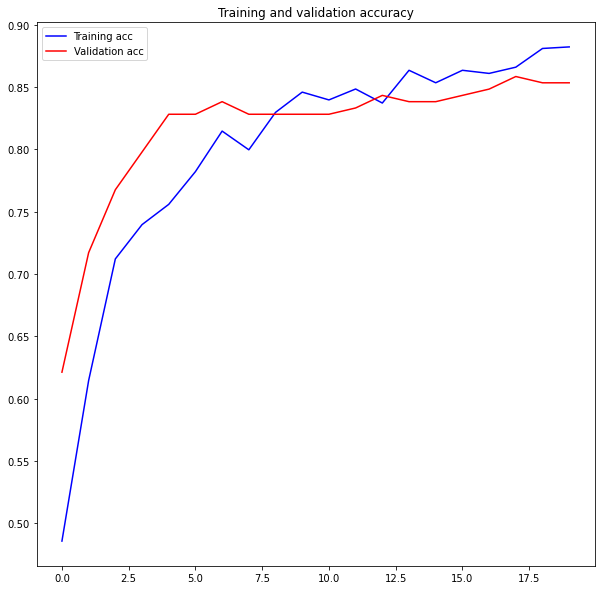

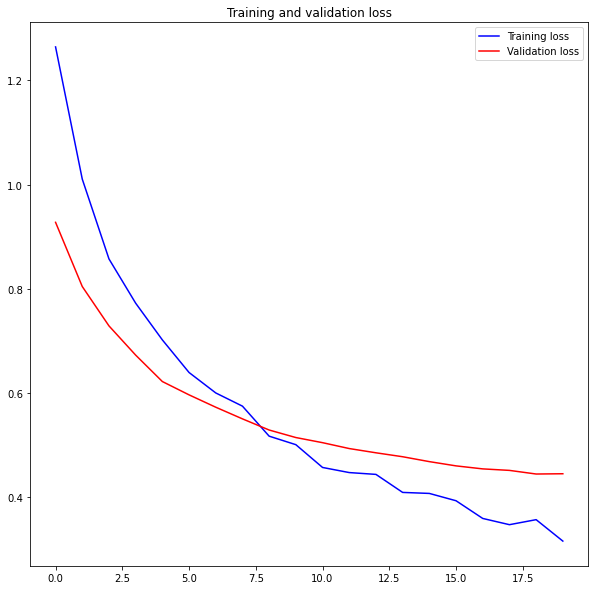

In [32]:
# Utility function for plotting of the model results
def visualize_results(history):
    # Plot the accuracy and loss curves
    acc = history.history['acc']
    val_acc = history.history['val_acc']
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs = range(len(acc))

    plt.plot(epochs, acc, 'b', label='Training acc')
    plt.plot(epochs, val_acc, 'r', label='Validation acc')
    plt.title('Training and validation accuracy')
    plt.legend()

    plt.figure()

    plt.plot(epochs, loss, 'b', label='Training loss')
    plt.plot(epochs, val_loss, 'r', label='Validation loss')
    plt.title('Training and validation loss')
    plt.legend()

    plt.show()


# Run the function to illustrate accuracy and loss
visualize_results(history)

### Display miss-classification

In [33]:
# Utility function for obtaining of the errors 
def obtain_errors(val_generator, predictions):
    # Get the filenames from the generator
    fnames = validation_generator.filenames

    # Get the ground truth from generator
    ground_truth = validation_generator.classes

    # Get the dictionary of classes
    label2index = validation_generator.class_indices

    # Obtain the list of the classes
    idx2label = list(label2index.keys())
    print("The list of classes: ", idx2label)

    # Get the class index
    predicted_classes = np.argmax(predictions, axis=1)

    errors = np.where(predicted_classes != ground_truth)[0]
    print("Number of errors = {}/{}".format(len(errors),validation_generator.samples))
    
    return idx2label, errors, fnames


# Utility function for visualization of the errors
def show_errors(idx2label, errors, predictions, fnames):
    # Show the errors
    for i in range(len(errors)):
        pred_class = np.argmax(predictions[errors[i]])
        pred_label = idx2label[pred_class]

        title = 'Original label:{}, Prediction :{}, confidence : {:.3f}'.format(
            fnames[errors[i]].split('/')[0],
            pred_label,
            predictions[errors[i]][pred_class])

        original = Image.open('{}/{}'.format(validation_dir,fnames[errors[i]]))
        plt.figure(figsize=[7,7])
        plt.axis('off')
        plt.title(title)
        plt.imshow(original)
        plt.show()

20/19 [==============================] - 36s 2s/step
The list of classes:  ['drink', 'food', 'inside', 'outside']
Number of errors = 29/198


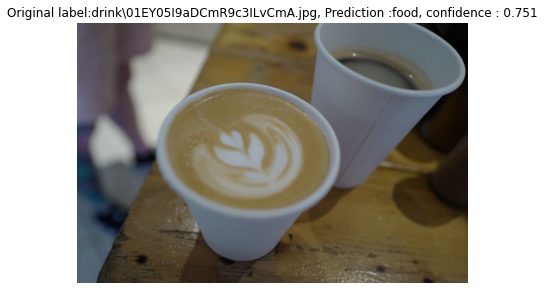

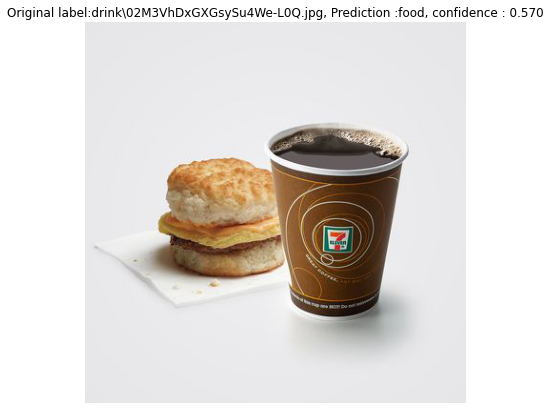

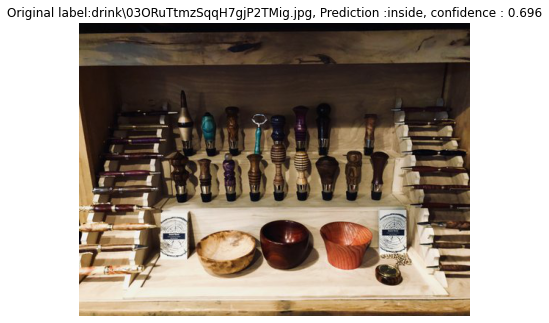

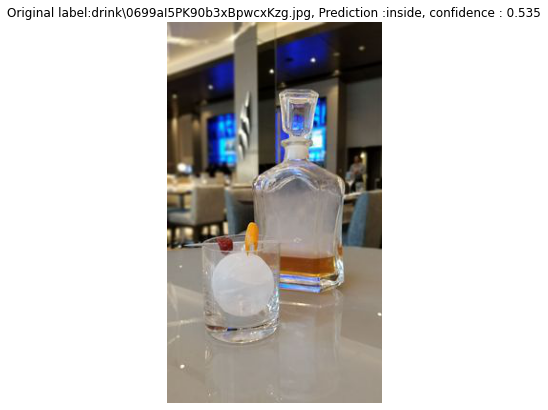

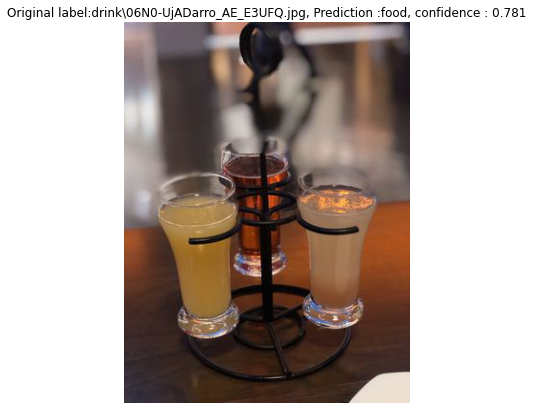

...

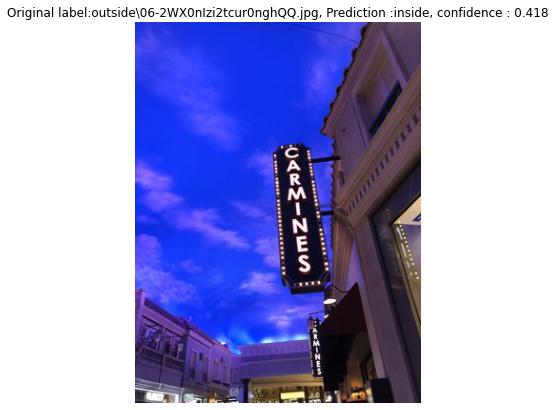

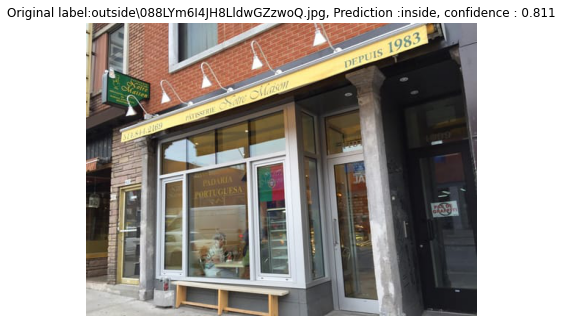

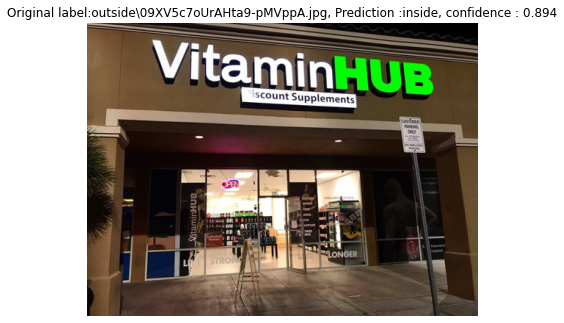

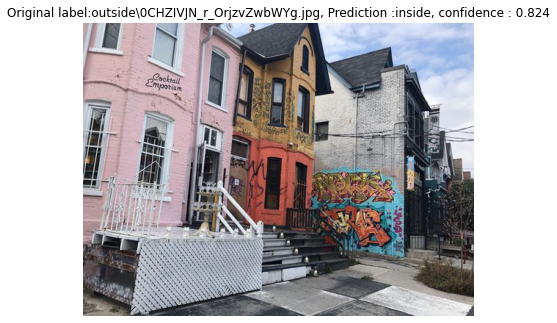

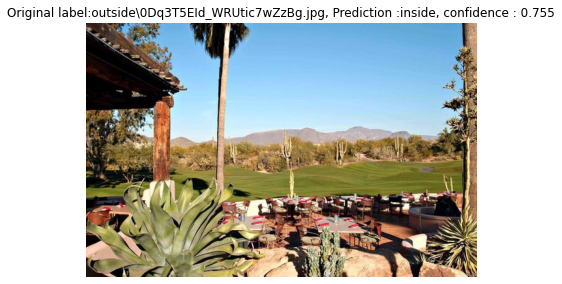

In [34]:
# Get the predictions from the model using the generator
predictions = model.predict(validation_generator, steps=validation_generator.samples/validation_generator.batch_size,verbose=1)

# Run the function to get the list of classes and errors
idx2label, errors, fnames = obtain_errors(validation_generator, predictions)

# Run the function to illustrate the error cases
show_errors(idx2label, errors, predictions, fnames)

### Visualize filters

In [75]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Functional)           (None, 7, 7, 512)         14714688  
_________________________________________________________________
flatten_1 (Flatten)          (None, 25088)             0         
_________________________________________________________________
dense_2 (Dense)              (None, 1024)              25691136  
_________________________________________________________________
dropout_1 (Dropout)          (None, 1024)              0         
_________________________________________________________________
dense_3 (Dense)              (None, 4)                 4100      
Total params: 40,409,924
Trainable params: 25,695,236
Non-trainable params: 14,714,688
_________________________________________________________________


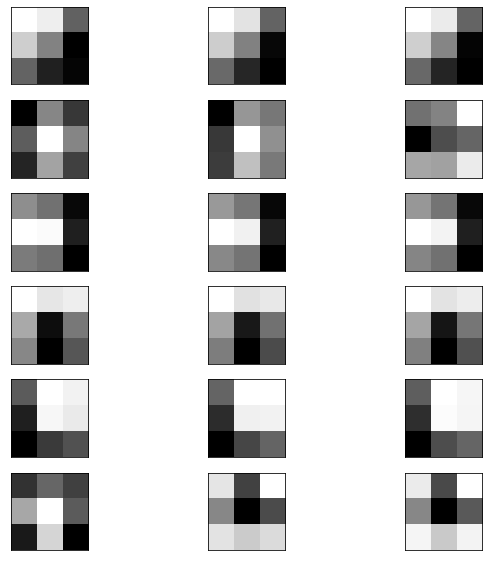

In [76]:
# retrieve weights from the second hidden layer
filters, biases = model.layers[0].layers[1].get_weights()
# normalize filter values to 0-1 so we can visualize them
f_min, f_max = filters.min(), filters.max()
filters = (filters - f_min) / (f_max - f_min)
# plot first few filters
n_filters, ix = 6, 1
for i in range(n_filters):
	# get the filter
	f = filters[:, :, :, i]
	# plot each channel separately
	for j in range(3):
		# specify subplot and turn of axis
		ax = plt.subplot(n_filters, 3, ix)
		ax.set_xticks([])
		ax.set_yticks([])
		# plot filter channel in grayscale
		plt.imshow(f[:, :, j], cmap='gray')
		ix += 1
# show the figure
plt.show()

In [77]:
model.layers[0].layers[1].output

<tf.Tensor 'block1_conv1/Relu_1:0' shape=(None, 224, 224, 64) dtype=float32>

### Visualize Feature maps

In [82]:
# summarize feature map size for each conv layer
from keras.applications.vgg16 import VGG16
from matplotlib import pyplot
# load the model
model = VGG16()
# summarize feature map shapes
for i in range(len(model.layers)):
	layer = model.layers[i]
	# check for convolutional layer
	if 'conv' not in layer.name:
		continue
	# summarize output shape
	print(i, layer.name, layer.output.shape)

1 block1_conv1 (None, 224, 224, 64)
2 block1_conv2 (None, 224, 224, 64)
4 block2_conv1 (None, 112, 112, 128)
5 block2_conv2 (None, 112, 112, 128)
7 block3_conv1 (None, 56, 56, 256)
8 block3_conv2 (None, 56, 56, 256)
9 block3_conv3 (None, 56, 56, 256)
11 block4_conv1 (None, 28, 28, 512)
12 block4_conv2 (None, 28, 28, 512)
13 block4_conv3 (None, 28, 28, 512)
15 block5_conv1 (None, 14, 14, 512)
16 block5_conv2 (None, 14, 14, 512)
17 block5_conv3 (None, 14, 14, 512)


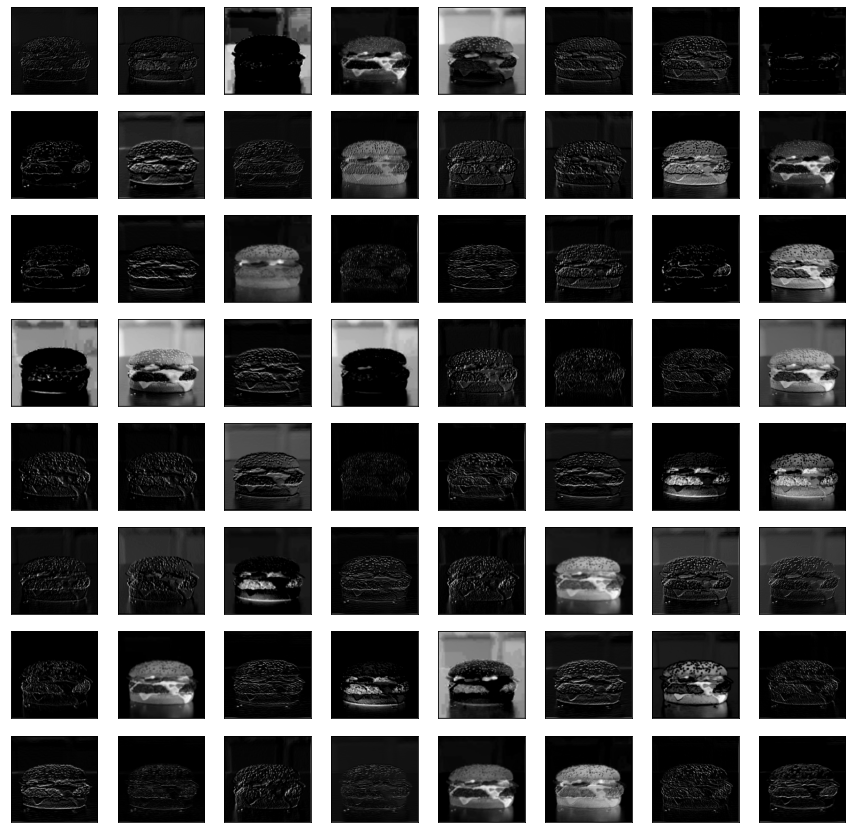

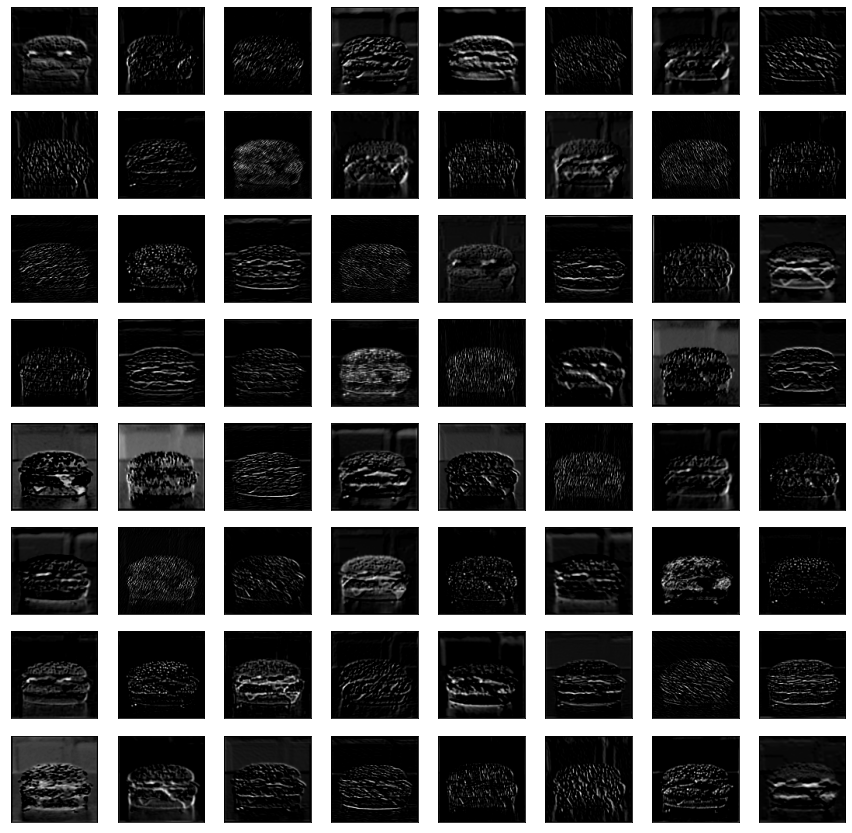

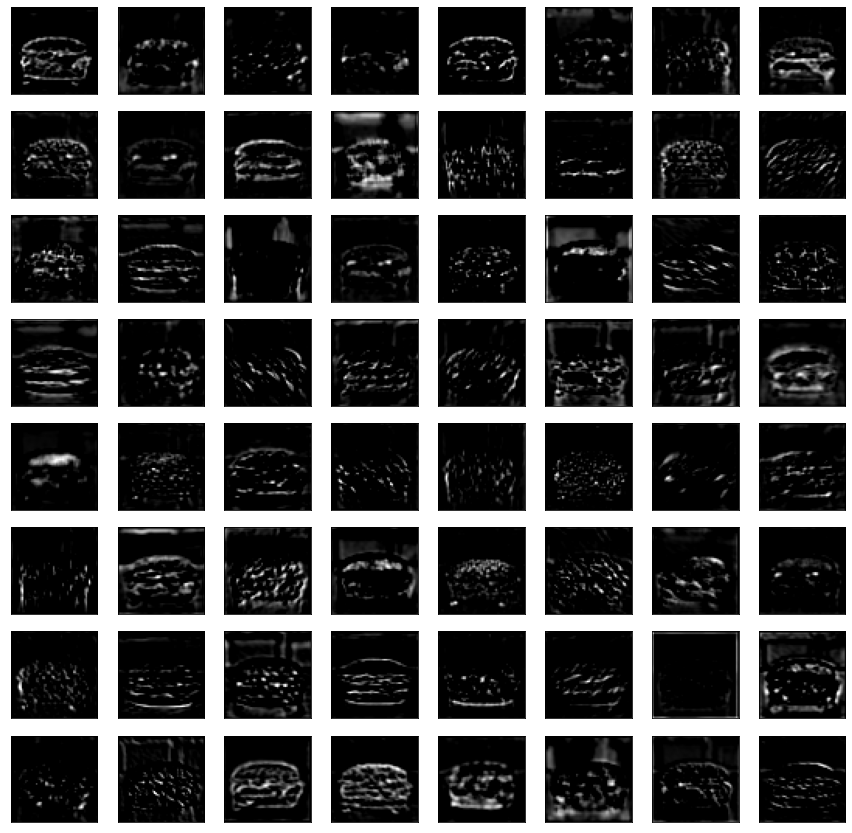

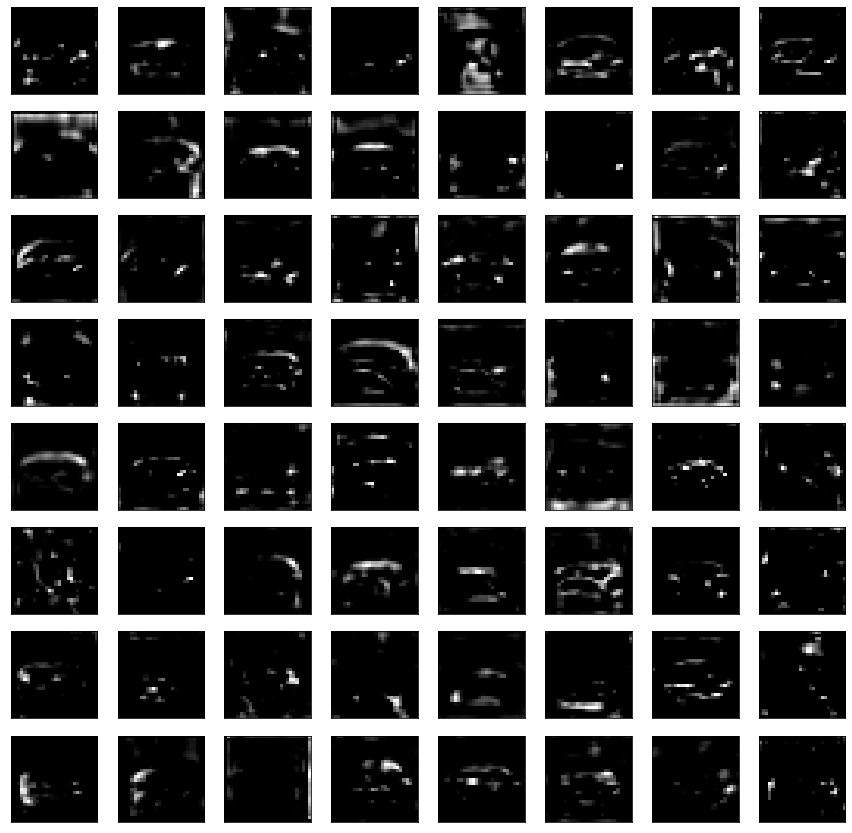

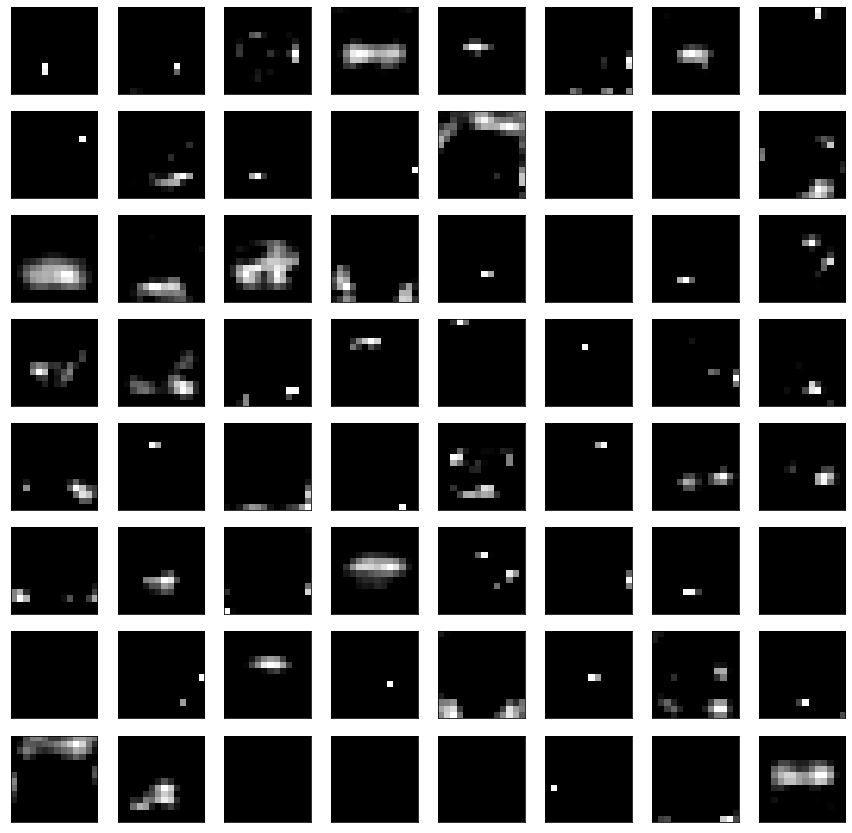

In [99]:
# visualize feature maps output from each block in the vgg model
from keras.applications.vgg16 import VGG16
from keras.applications.vgg16 import preprocess_input
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
from keras.models import Model
from matplotlib import pyplot
from numpy import expand_dims
# load the model
model = VGG16()
# redefine model to output after the specified layer
ixs = [2, 5, 9, 13, 17]
outputs = [model.layers[i].output for i in ixs]
model = Model(inputs=model.inputs, outputs=outputs)
# load the image with the required shape
img = load_img('D:\Data OC\P6\photos\_-5kQevPGSAdR0tOe0oCvg.jpg', target_size=(224, 224))
# convert the image to an array
img = img_to_array(img)
# expand dimensions so that it represents a single 'sample'
img = expand_dims(img, axis=0)
# prepare the image (e.g. scale pixel values for the vgg)
img = preprocess_input(img)
# get feature map for first hidden layer
feature_maps = model.predict(img)
# plot the output from each block
square = 8
for fmap in feature_maps:
	plt.figure(figsize=(15,15))
	# plot all 64 maps in an 8x8 squares
	ix = 1
	for _ in range(square):
		for _ in range(square):
			# specify subplot and turn of axis
			ax = pyplot.subplot(square, square, ix)
			ax.set_xticks([])
			ax.set_yticks([])
			# plot filter channel in grayscale
			pyplot.imshow(fmap[0, :, :, ix-1], cmap='gray')
			ix += 1   
	# show the figure
	pyplot.show()